# **Jigsaw Unintended Bias: Exploratory Data Analysis**

# **Contents**
### 1. Load Data from Kaggle
### 2. Data Exploration and Visualization
### 3. References

In [ ]:
#import dependencies
import pandas as pd 
import numpy as np 

import matplotlib.pyplot as plt 
import seaborn as sns 
import plotly.graph_objects as go
from wordcloud import WordCloud, STOPWORDS

from zipfile import ZipFile
import random
import warnings
warnings.filterwarnings('ignore')

# **1. Load data from Kaggle**
**(url - https://www.kaggle.com/competitions/jigsaw-unintended-bias-in-toxicity-classification/data)**

In [ ]:
!wget --header="Host: storage.googleapis.com" --header="User-Agent: Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/108.0.0.0 Safari/537.36" --header="Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/avif,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3;q=0.9" --header="Accept-Language: en-US,en;q=0.9" --header="Referer: https://www.kaggle.com/" "https://storage.googleapis.com/kaggle-competitions-data/kaggle-v2/12500/1375107/bundle/archive.zip?GoogleAccessId=web-data@kaggle-161607.iam.gserviceaccount.com&Expires=1671039518&Signature=Jlc5xo9f48Nxm9I%2BVi8qMHve6%2FvLqUum3sV8s3Ltx0gcwOas2zMoBApGSFBKQ5em5Zr7sX%2B5zGgUiTuozanxDMwKbC6RwTNcsJw7FgSKh6c8iTLM2rxlmBiqlLCxUohlqK%2Bp%2FxrdCtXJE9AwMcqNutMl3SHxJYPRzOJ1hFmZv4RLOOmIThw7GrtXQAMLMp6rkdN%2BIO144LIKe2U6HMKlPLjwZnCSj%2BbOf59OiFOBZkgV64TAOZScBw%2Bve%2BB2lfCzh9mIkDNfxR%2FWhwa5Np%2Bldppcyj6iDB9ze1BXUumthnA96s2YOGNEpzVwomlKA85k4q%2Fp99EAGxI4F%2FwatzYY3Q%3D%3D&response-content-disposition=attachment%3B+filename%3Djigsaw-unintended-bias-in-toxicity-classification.zip" -c -O 'jigsaw-unintended-bias-in-toxicity-classification.zip'

--2022-12-11 17:38:59--  https://storage.googleapis.com/kaggle-competitions-data/kaggle-v2/12500/1375107/bundle/archive.zip?GoogleAccessId=web-data@kaggle-161607.iam.gserviceaccount.com&Expires=1671039518&Signature=Jlc5xo9f48Nxm9I%2BVi8qMHve6%2FvLqUum3sV8s3Ltx0gcwOas2zMoBApGSFBKQ5em5Zr7sX%2B5zGgUiTuozanxDMwKbC6RwTNcsJw7FgSKh6c8iTLM2rxlmBiqlLCxUohlqK%2Bp%2FxrdCtXJE9AwMcqNutMl3SHxJYPRzOJ1hFmZv4RLOOmIThw7GrtXQAMLMp6rkdN%2BIO144LIKe2U6HMKlPLjwZnCSj%2BbOf59OiFOBZkgV64TAOZScBw%2Bve%2BB2lfCzh9mIkDNfxR%2FWhwa5Np%2Bldppcyj6iDB9ze1BXUumthnA96s2YOGNEpzVwomlKA85k4q%2Fp99EAGxI4F%2FwatzYY3Q%3D%3D&response-content-disposition=attachment%3B+filename%3Djigsaw-unintended-bias-in-toxicity-classification.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.197.128, 142.250.107.128, 74.125.142.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.197.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 758542209 (723M) [application/zip]
Sa

## **1.1 Extracting from Zip**

In [ ]:
with ZipFile('/content/jigsaw-unintended-bias-in-toxicity-classification.zip') as z:
    z.extractall()

## **1.2 Reading the Data**

In [ ]:
train = pd.read_csv('/content/train.csv', parse_dates = ['created_date'])
print(train.shape)
train.head()

(1804874, 45)


,id,target,comment_text,severe_toxicity,obscene,identity_attack,insult,threat,asian,atheist,...,article_id,rating,funny,wow,sad,likes,disagree,sexual_explicit,identity_annotator_count,toxicity_annotator_count
0,59848,0.000000,"This is so cool. It's like, 'would you want yo...",0.000000,0.0,0.000000,0.00000,0.0,NaN,NaN,...,2006,rejected,0,0,0,0,0,0.0,0,4
1,59849,0.000000,Thank you!! This would make my life a lot less...,0.000000,0.0,0.000000,0.00000,0.0,NaN,NaN,...,2006,rejected,0,0,0,0,0,0.0,0,4
2,59852,0.000000,This is such an urgent design problem; kudos t...,0.000000,0.0,0.000000,0.00000,0.0,NaN,NaN,...,2006,rejected,0,0,0,0,0,0.0,0,4
3,59855,0.000000,Is this something I'll be able to install on m...,0.000000,0.0,0.000000,0.00000,0.0,NaN,NaN,...,2006,rejected,0,0,0,0,0,0.0,0,4
4,59856,0.893617,haha you guys are a bunch of losers.,0.021277,0.0,0.021277,0.87234,0.0,0.0,0.0,...,2006,rejected,0,0,0,1,0,0.0,4,47


In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1804874 entries, 0 to 1804873
Data columns (total 45 columns):
 #   Column                               Dtype              
---  ------                               -----              
 0   id                                   int64              
 1   target                               float64            
 2   comment_text                         object             
 3   severe_toxicity                      float64            
 4   obscene                              float64            
 5   identity_attack                      float64            
 6   insult                               float64            
 7   threat                               float64            
 8   asian                                float64            
 9   atheist                              float64            
 10  bisexual                             float64            
 11  black                                float64            
 12  buddhist      

In [ ]:
train['target'].describe()

count    1.804874e+06
mean     1.030173e-01
std      1.970757e-01
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      1.666667e-01
max      1.000000e+00
Name: target, dtype: float64

## **1.3 Basic Data Manipulation**

**Note:** In this notebook we will address the **Target Feature as Toxicity or Overall Toxicity or Target** and we will address other **Toxicity Features (obscene, insult, threat, severe_toxicity, etc) as Toxicity Traits** 

In [ ]:
toxicity_feat = ['severe_toxicity', 'obscene', 'identity_attack', 'insult', 'threat', 'sexual_explicit']
identity_all = ['asian', 'atheist', 'bisexual','black', 'buddhist', 'christian', 'female', 'heterosexual', 'hindu','homosexual_gay_or_lesbian', 
 'intellectual_or_learning_disability', 'jewish', 'latino', 'male', 'muslim', 'other_disability', 'other_gender', 'other_race_or_ethnicity', 
 'other_religion', 'other_sexual_orientation', 'physical_disability','psychiatric_or_mental_illness', 'transgender', 'white']

In [ ]:
# convert target feature from real valued to binary 
train['target_bin'] = train['target'].apply(lambda x: 1 if x>=0.5 else 0).astype('int8')

# convert toxicity and identity features to binary 
for feat in toxicity_feat+identity_all:
    train[feat+'_bin'] = train[feat].apply(lambda x: 1 if x>=0.5 else 0).astype('int8')

In [ ]:
identity_all_bin = list(map(lambda x: x+'_bin', identity_all))

# create a binary feature which returns 1 if any identity is mentioned in the comment, otherwise returns 0
train['is_identity_mentioned'] = train[identity_all_bin].apply(lambda x: 1 if any(list(x)) else 0, axis=1)

# slower alternative:
# train['is_identity_mentioned'] = train[identity_feat_bin].apply(lambda x: 1 if x.sum()>0 else 0, axis=1)

In [ ]:
# create a list of identity feature names which will be considered when evaluating models
identity_main = ['male', 'female', 'homosexual_gay_or_lesbian', 'christian', 'jewish',  'muslim', 'black', 'white', 'psychiatric_or_mental_illness']
identity_main_bin = list(map(lambda x: x+'_bin', identity_main))

In [ ]:
# fill nan values in identity columns 
train[identity_all] = train[identity_all].fillna(0)

# **2. Data Exploration and Visualization**

## **2.1 Toxicity Class Distribution**
Aim: Understanding the distribution of toxic and non-toxic comments in the data.

In [ ]:
train['target_bin'].value_counts()

0    1660540
1     144334
Name: target_bin, dtype: int64

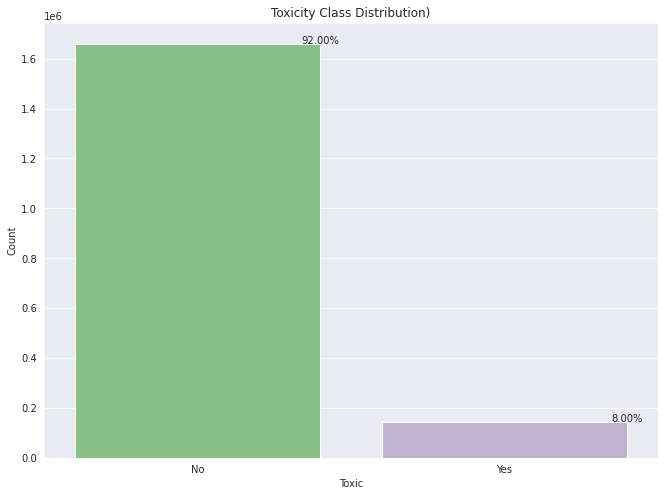

In [ ]:
sns.set_style('darkgrid')
plt.figure(figsize=(11,8))
ax = sns.countplot(data = train, x='target_bin', palette='Accent')
# refer - https://www.codegrepper.com/code-examples/python/how+to+add+percentage+in+countplot
for p in ax.patches:
    percentage = '{:.2f}%'.format(100 * p.get_height()/len(train))
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(percentage, (x, y),ha='center')
ax.set(title = 'Toxicity Class Distribution)', xlabel = 'Toxic', ylabel='Count')
ax.set_xticklabels(['No', 'Yes'])
plt.show()

Observations: 
- Total Non-Toxic Comments is ~1.66 Million which accounts for 92% of the whole dataset.
- Total Toxic Comments is ~144K which accounts for 8% of the whole dataset.
- Clearly, we are dealing with highly imbalanced data here.

## **2.2 Identity Mentioned Feature Distribution**
Aim: Understanding the distribution of comments where identity is mentioned and where it isn't in the data.

In [ ]:
train['is_identity_mentioned'].value_counts()

0    1634570
1     170304
Name: is_identity_mentioned, dtype: int64

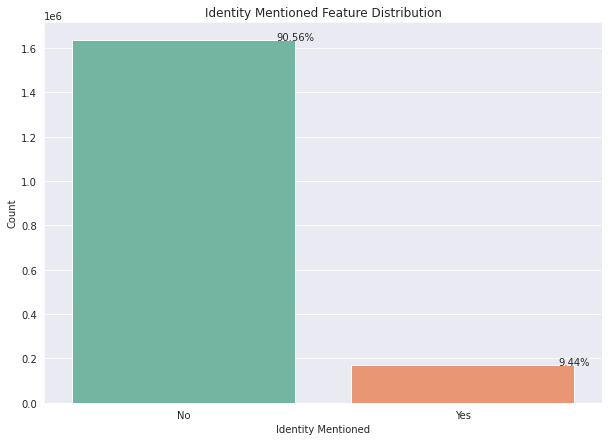

In [ ]:
sns.set_style('darkgrid')
plt.figure(figsize=(10,7))
ax = sns.countplot(data = train, x='is_identity_mentioned', palette='Set2')
for p in ax.patches:
    percentage = '{:.2f}%'.format(100 * p.get_height()/len(train))
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(percentage, (x, y),ha='center')
ax.set(title = 'Identity Mentioned Feature Distribution', xlabel = 'Identity Mentioned', ylabel='Count')
ax.set_xticklabels(['No', 'Yes'])
plt.show()

Observations:
- Total Comments not mentioning any Identity is ~1.63 Million which accounts for 90.56% of the whole dataset.
- Total Comments mentioning atleast one Identity is ~170K which accounts for 9.44% of the whole dataset.

## **2.3 Identity Feature Distribution with Toxicity Class**

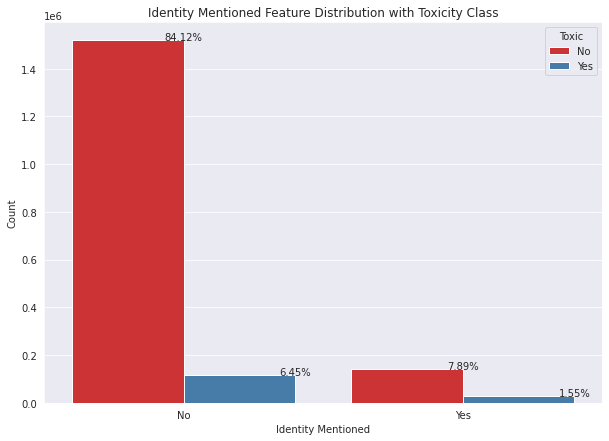

In [ ]:
sns.set_style('darkgrid')
plt.figure(figsize=(10,7))
ax = sns.countplot(data = train, x='is_identity_mentioned', hue='target_bin', palette='Set1')
for p in ax.patches:
    percentage = '{:.2f}%'.format(100 * p.get_height()/len(train))
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(percentage, (x, y),ha='center')
ax.set(title = 'Identity Mentioned Feature Distribution with Toxicity Class', xlabel = 'Identity Mentioned', ylabel='Count')
ax.set_xticklabels(['No', 'Yes'])
ax.legend(title='Toxic', labels=['No','Yes'])
plt.show()

Observations:
- The above plot gives the bifurcation of toxic and non-toxic comments in comments where at least one identity is mentioned and in comments where no identity is mentioned.
- Toxic comments where in no identity is mentioned are 6.45% of the total comments. 
- Toxic comments where an identity is mentioned are 1.55% of the total comments.

## **2.4 Exploring Comments mentioning Identity**

### **2.4.1 Distribution of Comments mentioning/not mentioning a particular identity**

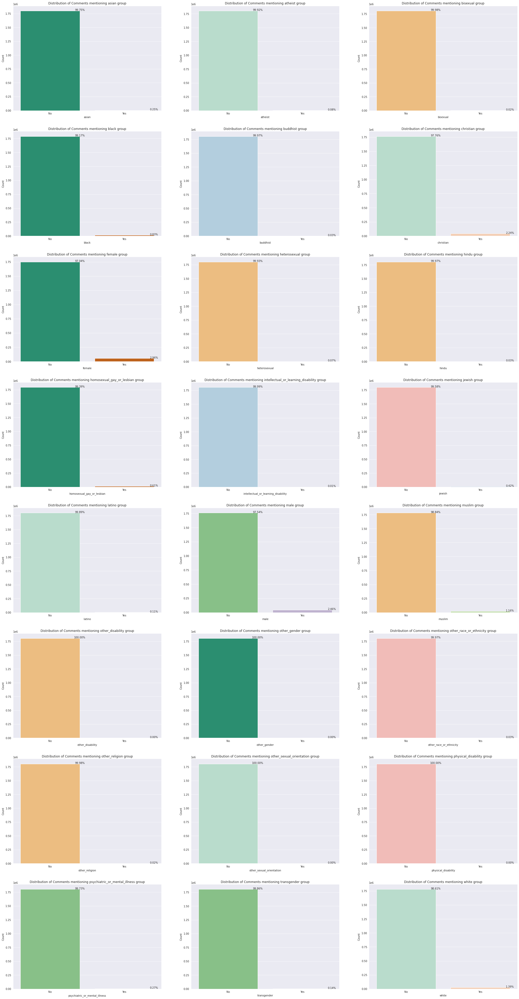

In [ ]:
sns.set_style('darkgrid')
palettes = ['Accent', 'Blues', 'Pastel1', 'Pastel2', 'Spectral', 'Dark2'] 
plt.figure(figsize=(35,70))

for i in range(1,len(identity_all_bin)+1):    
    plt.subplot(8,3,i)
    ax = sns.countplot(data=train, x=identity_all_bin[i-1], palette = random.choice(palettes))
    for p in ax.patches:
        percentage = '{:.2f}%'.format(100 * p.get_height()/len(train))
        x = p.get_x() + p.get_width()
        y = p.get_height()
        ax.annotate(percentage, (x, y),ha='center')
    
    ax.set(title = f'Distribution of Comments mentioning {identity_all[i-1]} group', xlabel = f'{identity_all[i-1]}', ylabel='Count', )
    ax.set_xticklabels(['No', 'Yes'])
    
plt.show()

Observations:
- The following identities: female(2.96%), male(2.46%), christian(2.24%), and white(1.39%) are the most commonly mentioned identities in the comments.
- The following identities: other_disability, other_gender, other_sexual_orientation, physical_disability are the least mentioned identities in the comments. (Note: The plot shows their occurence percentage as 0 because the value is too small and is rounded off) 

## **2.4.2 Toxicity Class Distribution in Comments mentioning a particular Identity**

In [ ]:
# select rows where identity is mentioned (any) 
query_df =  train[(train['is_identity_mentioned']==1)]

# create an empty dataframe
temp_df = pd.DataFrame(columns = ['identity', 'target', 'count'])

# for each identity append the count of toxic and non-toxic comments to the dataframe created above
for id_bin in identity_all_bin:
    id = id_bin.replace('_bin', '')
    temp_df = temp_df.append({'identity' : id, 'target' : 0, 'count' : list(query_df[query_df[id_bin]==1]['target_bin'].value_counts())[0]},
        ignore_index = True)
    temp_df = temp_df.append({'identity' : id, 'target' : 1, 'count' : list(query_df[query_df[id_bin]==1]['target_bin'].value_counts())[1]},
        ignore_index = True)

temp_df.head()

,identity,target,count
0,asian,0,4012
1,asian,1,566
2,atheist,0,1227
3,atheist,1,185
4,bisexual,0,225


In [ ]:
# create lists grouping similar identity types in one list 
race = ['black', 'white', 'asian', 'latino', 'jewish', 'other_race_or_ethnicity']
religion = ['hindu', 'muslim', 'christian', 'buddhist', 'atheist', 'other_religion']
gender = ['male', 'female', 'transgender', 'other_gender']
sexual_orientation = ['heterosexual', 'bisexual', 'homosexual_gay_or_lesbian', 'other_sexual_orientation']
disability =  ['physical_disability', 'psychiatric_or_mental_illness', 'intellectual_or_learning_disability', 'other_disability']

groups = [race, religion, gender, sexual_orientation, disability]
group_names = ['Race', 'Religion', 'Gender', 'Sexual Orientation', 'Disability']

In [ ]:
def plot_class_disb_in_groups(group, group_name):
    sns.set(style="darkgrid")
    # refer to set size of catplot - https://stackoverflow.com/a/51602446
    ax = sns.catplot(data=temp_df[temp_df['identity'].isin(group)], kind="bar", x='identity', y="count", hue='target', height=6.5, aspect=14/8, palette='Set2_r')
    ax.set(title = f'Toxicity Class Distribution for each Identity in {group_name}', xlabel = 'Identity', ylabel='Count')
    ax.set_xticklabels(rotation = 15)
    # refer to change legend labels and title - https://www.folkstalk.com/tech/sns-histplot-change-legend-labels-with-code-examples/
    ax._legend.set_title('Toxic')
    new_labels = ["No", "Yes"]
    for t, l in zip(ax._legend.texts, new_labels):
        t.set_text(l)
    sns.move_legend(ax, "top right")

    return plt.show()

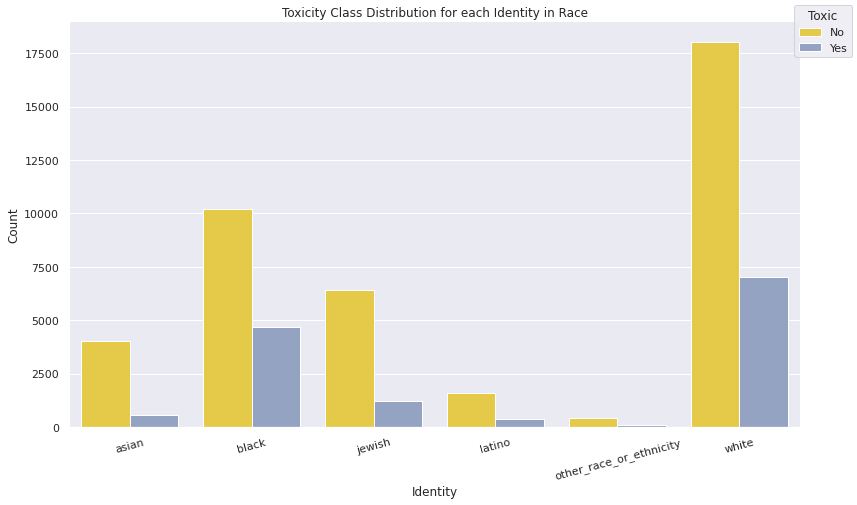

In [ ]:
plot_class_disb_in_groups(groups[0], group_names[0])

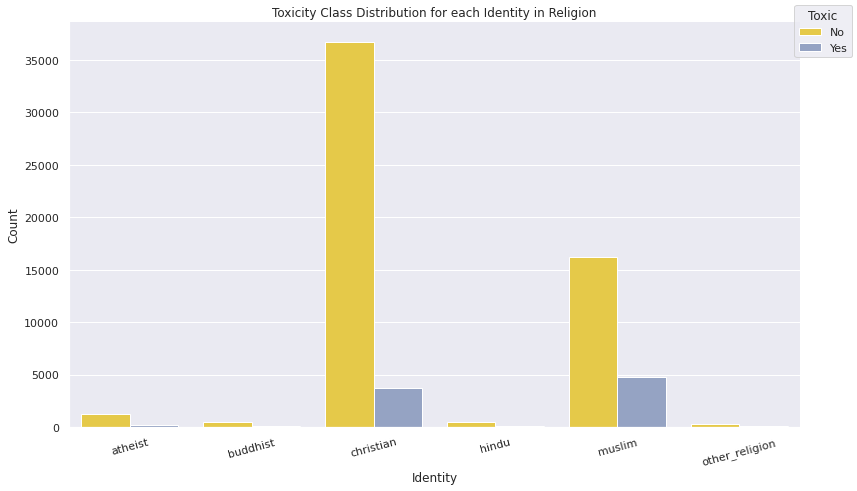

In [ ]:
plot_class_disb_in_groups(groups[1], group_names[1])

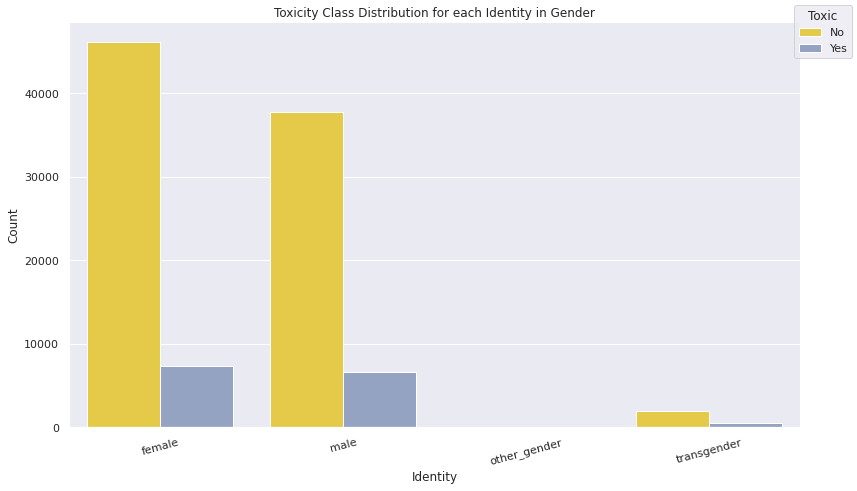

In [ ]:
plot_class_disb_in_groups(groups[2], group_names[2])

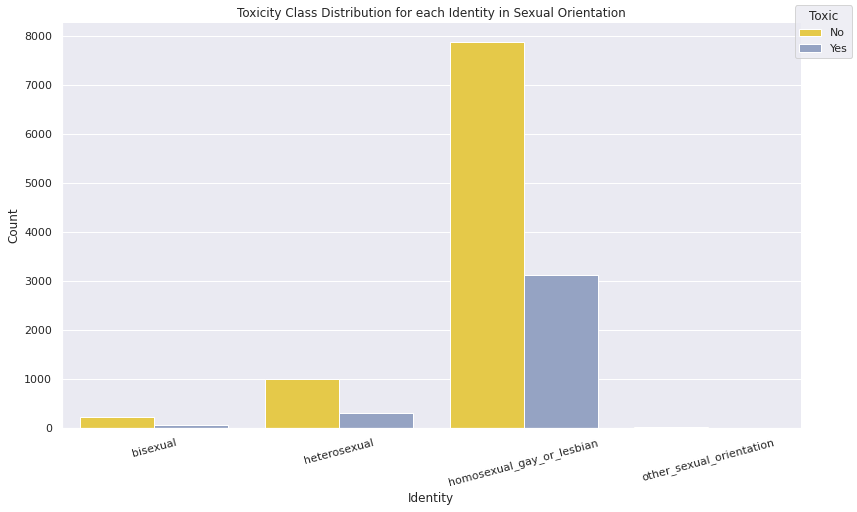

In [ ]:
plot_class_disb_in_groups(groups[3], group_names[3])

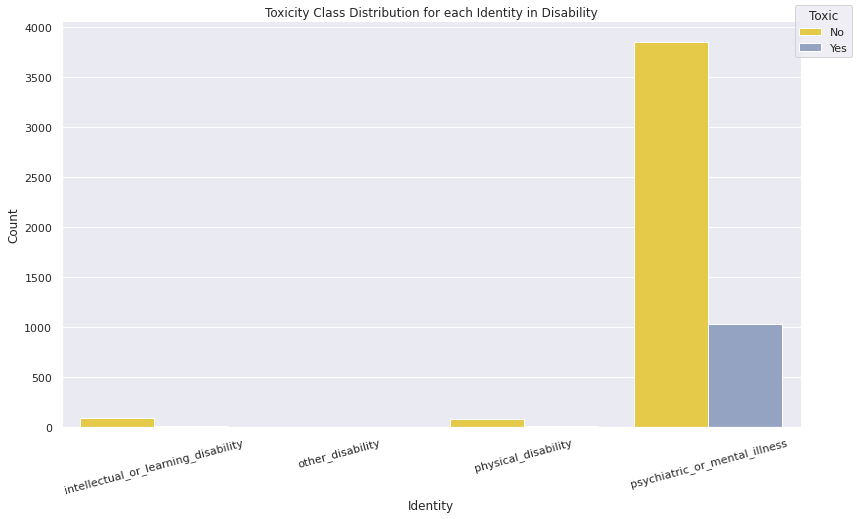

In [ ]:
plot_class_disb_in_groups(groups[4], group_names[4])

In [ ]:
# create a dataframe to observe non_toxic to toxic comment count ratio for each identity 
ids = np.array(temp_df[temp_df['target']==0]['identity'])
ratios = np.array(temp_df[temp_df['target']==0]['count'])/np.array(temp_df[temp_df['target']==1]['count'])
ratio_df = pd.DataFrame({'identity':ids, 'ratio':ratios})
ratio_df.sort_values('ratio', ascending=False)

,identity,ratio
10,intellectual_or_learning_disability,14.5
20,physical_disability,12.666667
5,christian,10.005445
8,hindu,8.508197
4,buddhist,7.521739
0,asian,7.088339
1,atheist,6.632432
6,female,6.308029
18,other_religion,5.914894
13,male,5.654301


Observations: 
- The above plots represent the count of toxic/non-toxic comments highlighting a particular identity.
- The dataset is imbalanced and therfore it reflects the same in the ratio of non-toxic/toxic comment counts highlighting a particular identity.
- The identities with smaller ratio and significant number of comments like black, homosexual_gay_or_lesbian, white, muslim indicate that these identities are subjected to more toxic comments out of 'their' total comments as compared to other identities with significant comments.
- The identities with higher ratio and significant number of comments like christian, female, male, jewish indicate that these identities are subjected to much lesser toxic comments out of 'their' total comments as compared to other identities with significant comments.

## **2.5 Exploring Traits and Reactions attached to comments**

### **2.5.1 Relation between Toxicity Traits including Overall Toxicity (Target Feature) of comments**
Aim: Check correlation between toxicity traits including overall toxicity of comments. 

**Note:** Toxicity Traits and Overall Toxicity (Target) are both rated by toxicity annotators and both have a value in the range [0,1] depending on how many annotators voted yes for a particular feature out of total annotators assigned. So, all these features are continuous in nature. 

**For instance:** If there's a strong positive correlation between 'obscene' and 'insult' traits then it indicates that most of the times when annotators have majorly voted for obscene trait in a comment then there's a high chance that that comment will have a high voting for 'insult' trait too and overall this indicates that for most of the comments that are obscene, those are insulting too and vice versa.

In [ ]:
toxicity_all = toxicity_feat+['target']

In [ ]:
temp_df = train[toxicity_all].corr()

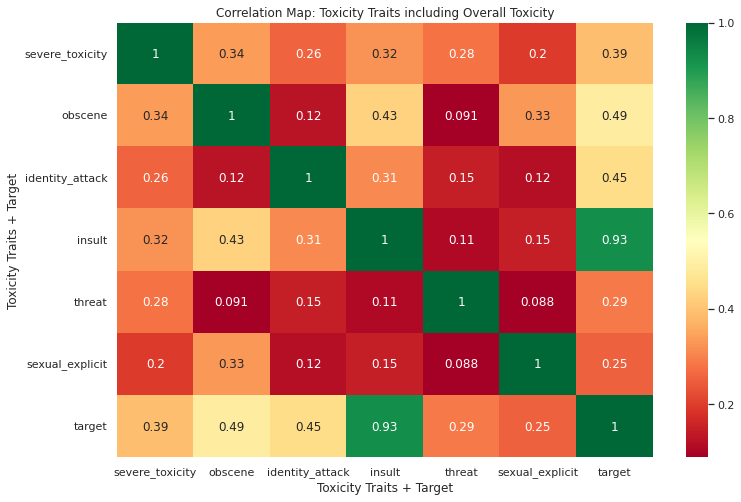

In [ ]:
plt.figure(figsize=(12,8))
ax = sns.heatmap(temp_df, cmap='RdYlGn', annot=True)
ax.set(title = f'Correlation Map: Toxicity Traits including Overall Toxicity', xlabel = 'Toxicity Traits + Target', ylabel='Toxicity Traits + Target')
plt.show()

Observations: 
- Pearson Coefficient value between insult and target feature indicate a fairly strong positive correlation. This implies if insult value is high then target value tends to be high similarly target tends to be low if insult value is low. 
- Pearson Coefficient value for obscene and target feature pair and identity_attack and target feature pair indicate a moderate positive correlation. 

### **2.5.2 Relation between Reactions including Overall Toxicity (Target Feature) of comments**
Aim: Check correlation between comment reactions including overall toxicity of comments.

In [ ]:
reactions = ['funny', 'wow', 'sad', 'likes', 'disagree']

In [ ]:
temp_df = train[reactions+['target']].corr()

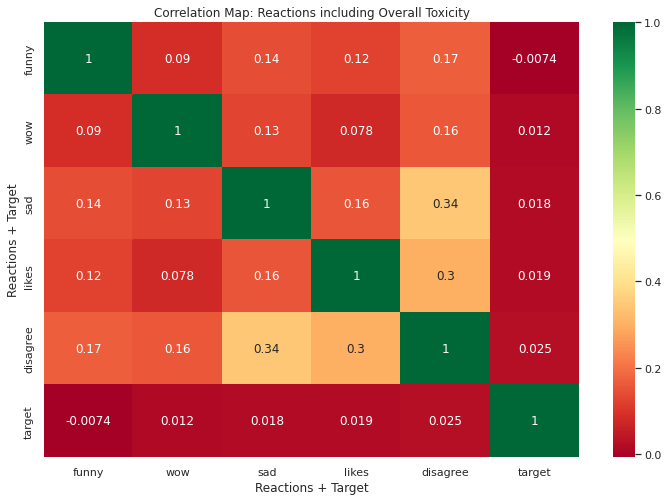

In [ ]:
plt.figure(figsize=(12,8))
ax = sns.heatmap(temp_df, cmap='RdYlGn', annot=True)
ax.set(title = f'Correlation Map: Reactions including Overall Toxicity', xlabel = 'Reactions + Target', ylabel='Reactions + Target')
plt.show()

Observations: 
- None of the reactions are correlated with the target feature.
- Pearson Coefficient value for disagree and likes feature pair and disagree and sad feature pair indicate a moderate positive correlation.

### **2.5.3 Relation between Toxicity Traits and Identities**
Aim: Check correlation between toxicity traits and identity.

In [ ]:
temp_df = pd.DataFrame(index = identity_main, columns = toxicity_all)
for id in identity_main:
    for trait in toxicity_all:
        temp_df.loc[id, trait] = float(train[id].corr(train[trait]))
temp_df = temp_df.astype('float')

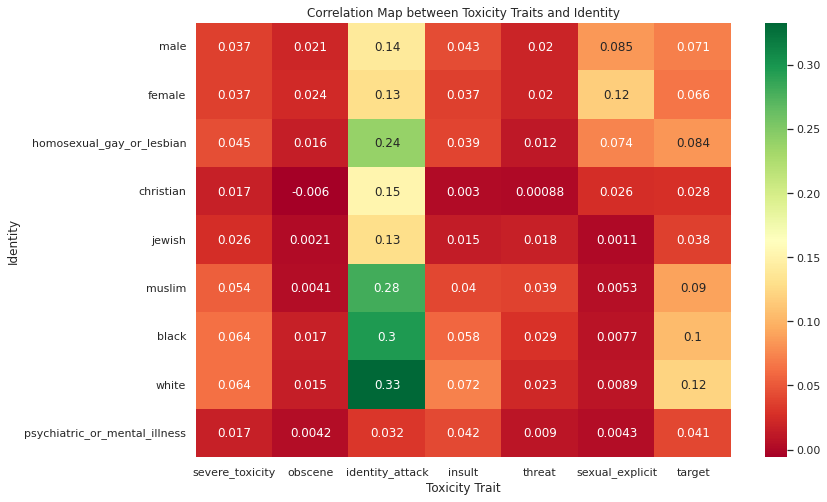

In [ ]:
plt.figure(figsize=(12,8))
ax = sns.heatmap(temp_df, cmap='RdYlGn', annot=True)
ax.set(title = f'Correlation Map between Toxicity Traits and Identity', xlabel = 'Toxicity Trait', ylabel='Identity')
plt.show()

Observations: 
- All identities except psychiatric_mental_illness show comparitively higher correlation with identity_attack trait than any other traits. However, the  correlation is positive but the magnitude cannot be considered strong. 
- None of the identities depict a strong correlation with the target feature.

## **2.5.3 Relation between Reactions and Identities**
Aim: Check correlation between comment reactions and identity.

In [ ]:
temp_df = pd.DataFrame(index = identity_main, columns = reactions)
for id in identity_main:
    for re in reactions:
        temp_df.loc[id, re] = float(train[id].corr(train[re]))
temp_df = temp_df.astype('float')

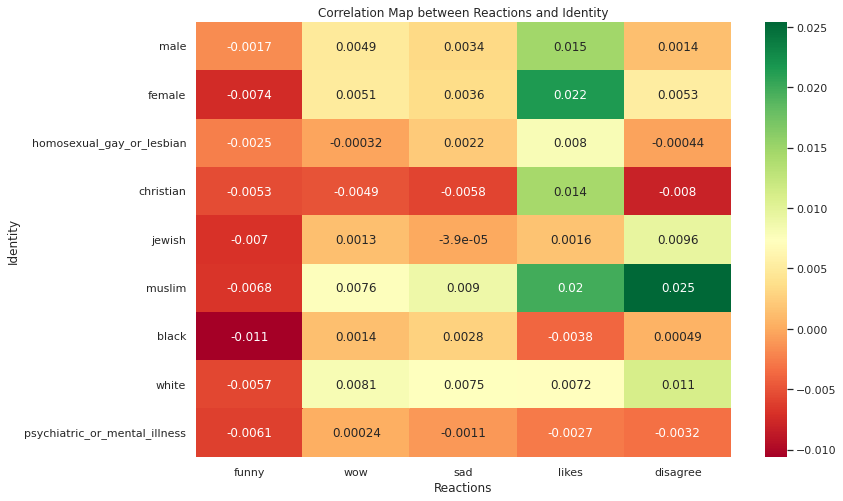

In [ ]:
plt.figure(figsize=(12,8))
ax = sns.heatmap(temp_df, cmap='RdYlGn', annot=True)
ax.set(title = f'Correlation Map between Reactions and Identity', xlabel = 'Reactions', ylabel='Identity')
plt.show()

Observations:
- None of the identities show a strong relation with any of the reactions 

## **2.6 Exploring Relation between Identities and Overall Toxicity**

In [ ]:
temp = identity_main+['target']
temp_df = train[temp].corr()

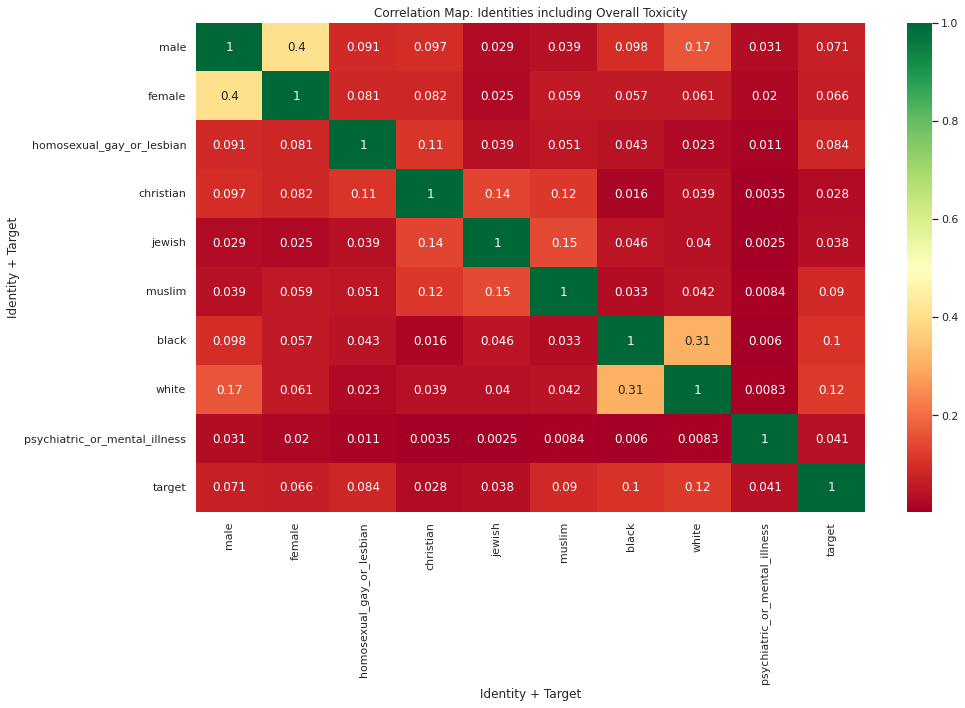

In [ ]:
plt.figure(figsize=(15,9))
ax = sns.heatmap(temp_df, cmap='RdYlGn', annot=True)
ax.set(title = f'Correlation Map: Identities including Overall Toxicity', xlabel = 'Identity + Target', ylabel='Identity + Target')
plt.show()

Observations: 
- Identity pairs (male,female) and (black,white) depict moderate positive correlation which is higher than any other pairs, the reason being that these pairs include opposite identities which are often mentioned together for drawing simlarities or comparisons and therefore there is a high chance that if one of the identities is mentioned then other one in the pair is too.
- None of the identities depict a strong relation with the target feature.

## **2.7 Exploring Word Count and Comment Length**

## **2.7.1 Relation between Word Count and Overall Toxicity**

In [ ]:
train['wordcount'] = train['comment_text'].apply(lambda x: len(x.split(' ')))

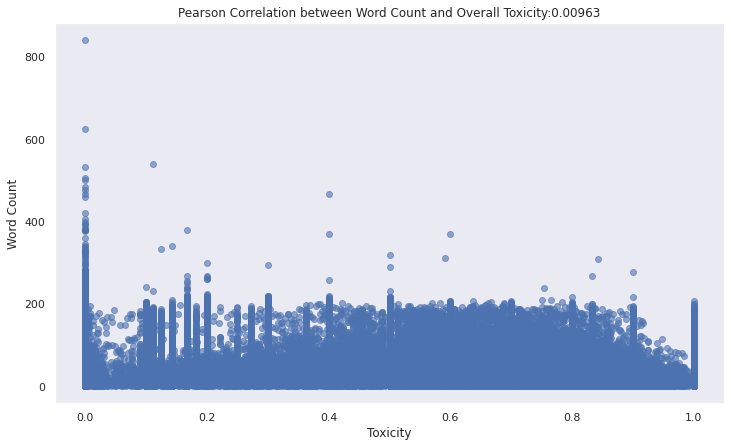

In [ ]:
plt.figure(figsize=(12,7))
plt.scatter(x=train['target'], y=train['wordcount'], alpha = 0.6) 
plt.title(f'Pearson Correlation between Word Count and Overall Toxicity:{round(train["wordcount"].corr(train["target"]),5)}')
plt.xlabel('Toxicity')
plt.ylabel('Word Count')
plt.grid('on')
plt.show()

Observations:
- Clearly from the above plot, word count of a comment does not show any significant to the overall toxicity.

## **2.8 Time Series Analysis**

**Note:** The below analysis is conducted on binary transformed features(toxicity traits, identities, target). We are observing the count/ratio of comments of a particular type on the time series.

## **2.8.1 Time Series Analysis of Comment Count**

In [ ]:
# set the created_date feature dtype to day wise 
train['created_date'] = train['created_date'].values.astype('datetime64[D]')

In [ ]:
query_df = pd.DataFrame(train.groupby(['created_date'])['target_bin'].count())
query_df['toxic_comments'] = (train.groupby(['created_date'])['target_bin'].sum()).astype(int)
query_df.columns = ['total_comments', 'toxic_comments']
query_df.head()

,total_comments,toxic_comments
created_date,,
2015-09-29,324,18
2015-10-06,144,9
2015-10-13,88,7
2015-10-27,24,0
2015-10-28,4,0


In [ ]:
fig = go.Figure()
cols = query_df.columns.tolist()
for col in cols:
        fig.add_trace(go.Scatter(x=query_df.index, y=query_df[col], mode='lines', name=col))

fig.update_xaxes(
    title_text="Date",
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1d", step="day", stepmode="backward"),
            dict(count=7, label="7d", step="day", stepmode="backward"),
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)

fig.update_yaxes(title_text="Number of comments")
fig.update_layout(title = f'Number of Comments per day', paper_bgcolor="cornsilk")
fig.show()

Observations: 
- Toxic Comments and Total Comments both depict an upward trend. 
- No seasonality component is observed in both series. 
- The number of total comments is very low till March'2016 and extremely low from Oct,2015 to Jan,2016.
- A weekly pattern is observed where the total comments start rising when week starts then peak in mid week and again fall on weekend. This indicates that the platform observes highest activity mid week and low activity on initial weekday(s) and weekends.
- There's no specific pattern that can be observed when it comes to toxic comments.

### **2.8.2 Time Series Analysis of Toxic Comments**
Aim: Observing the ratio of toxic comments to total comments on time series, to note which time periods experienced high/low amounts of toxic comments.

**Approach:** 

To conduct the analysis below we make sure to use perecentages/ratios because each day has observed different amount of comments. For instance, Day-1 has total 1000 comments, Day-2 has total 300 comments, so on. In such case, when we are aiming to analyse the amount of toxic comments or comments mentioning identity, it is necessary to use ratio of the particular type of comments to total comments to know the exact contribution of the particular type of comments to the total comments.

In [ ]:
query_df = pd.DataFrame(train.groupby(['created_date'])['target_bin'].mean())
query_df.columns = ['percent_toxic']
query_df.head()

,percent_toxic
created_date,
2015-09-29,0.055556
2015-10-06,0.062500
2015-10-13,0.079545
2015-10-27,0.000000
2015-10-28,0.000000


In [ ]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=query_df.index, y=query_df['percent_toxic'], mode='lines', name='percent_toxic'))

fig.update_xaxes(
    title_text="Date",
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1d", step="day", stepmode="backward"),
            dict(count=7, label="7d", step="day", stepmode="backward"),
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)

fig.update_yaxes(title_text="Percentage of toxic comments")
fig.update_layout(title = f'Time Series Analysis of Toxic Comments', paper_bgcolor="cornsilk")
fig.show()

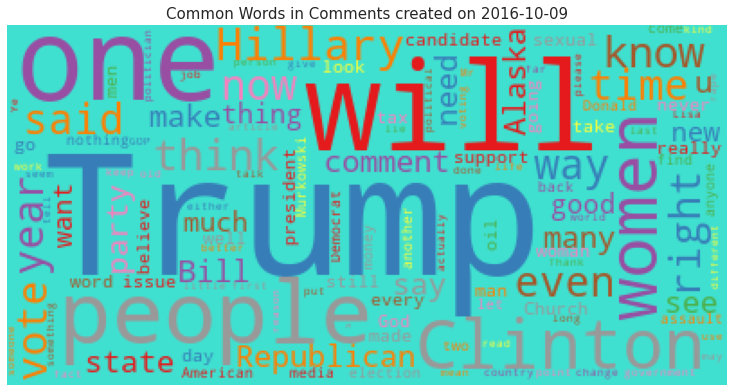

In [ ]:
temp = " ".join(train[train['created_date']=='2016-10-09']['comment_text'])
stopwords = set(STOPWORDS)

plt.figure(figsize=(10, 6))
wordcloud = WordCloud(width = 400, height = 200,
                    background_color = 'turquoise',
                    colormap = 'Set1',
                    collocations = False,
                    stopwords = stopwords,
                    min_font_size = 6,
                    random_state = 21).generate(temp)
plt.title("Common Words in Comments created on 2016-10-09", fontsize=15)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.show()

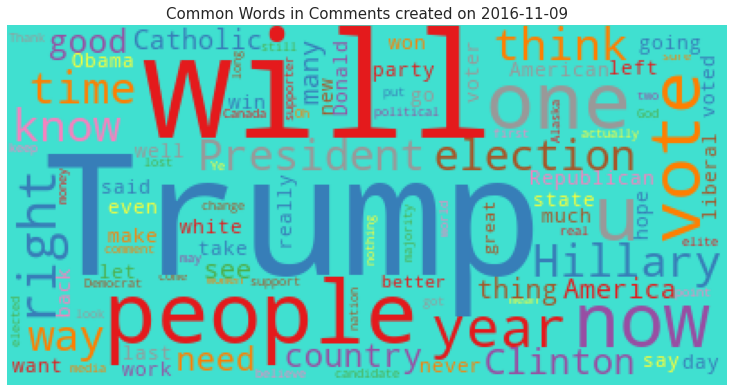

In [ ]:
temp = " ".join(train[train['created_date']=='2016-11-09']['comment_text'])

plt.figure(figsize=(10, 6))
wordcloud = WordCloud(width = 400, height = 200,
                    background_color = 'turquoise',
                    colormap = 'Set1',
                    collocations = False,
                    stopwords = stopwords,
                    min_font_size = 6,
                    random_state = 21).generate(temp)
plt.title("Common Words in Comments created on 2016-11-09", fontsize=15)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.show()

Observations: 
- 15th Jan'2016 observed the highest percentage(~26%) of toxic comments but the total comments on that day is not a significant number.
- The percentage of toxic comments per day tends to stay in a range of 5-15% from Jun'2016 onwards.
- There's a sudden rise in toxic comments on 9th Oct'2016 constituting to 14% of the total comments. After generating the wordcloud for those comments and investigating major events it is found that the 2nd US Presidential Debate for the election that year had been conducted which could have led to this rise in toxic comments. The wordcloud generated further reinforces our hypothesis.  
- There's another rise in toxic comments observed on 9th Nov'2016 exactly after one month constituting to 12% of the total comments. Upon investigating it is found that US election results are out favoring Trump which could be the reason for this rise. The wordcloud generated suggests the same.


In [ ]:
def TimeSeriesPlot(df, group, group_name, comment_class=None):
    '''Returns Time Series Plot of measure of comments representing all identities in a group.'''
    
    cols = list(map(lambda x: x+'_bin', group))
    fig = go.Figure()
    for col in cols:
        fig.add_trace(go.Scatter(x=df.index, y=df[col], mode='lines', name=col.replace('_bin',''),
                             hovertemplate=group_name+"=%s<br>Date=%%{x}<br><br>Percentage of Comments=%%{y}<br>"%(col.replace('_bin',''))))

    fig.update_xaxes(
        title_text="Date",
        rangeslider_visible=True,
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1d", step="day", stepmode="backward"),
                dict(count=7, label="7d", step="day", stepmode="backward"),
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(step="all")
            ])
        )
    )

    fig.update_yaxes(title_text="Percentage of comments")
    if comment_class:
        fig.update_layout(title = f'Time Series Analysis of "{comment_class}" Comments: Observing {group_name}',  legend_title_text = group_name, paper_bgcolor="cornsilk")
    else:
        fig.update_layout(title = f'Time Series Analysis of "All" Comments: Observing {group_name}',  legend_title_text = group_name, paper_bgcolor="cornsilk")


    return fig.show()

### **2.8.3 Time Series Analysis of Comments highlighting a Toxicity Trait**
Aim: Observing the ratio of comments highlighting a toxicity trait to total comments, to see which toxicity trait in the comments is seen increasing or decreasing with time.

In [ ]:
toxicity_bin = list(map(lambda x: x+'_bin', toxicity_feat))
query_df = pd.DataFrame(train.groupby(['created_date'])[toxicity_bin].mean())
query_df.head()

,severe_toxicity_bin,obscene_bin,identity_attack_bin,insult_bin,threat_bin,sexual_explicit_bin
created_date,,,,,,
2015-09-29,0.0,0.015432,0.0,0.043210,0.0,0.0
2015-10-06,0.0,0.027778,0.0,0.062500,0.0,0.0
2015-10-13,0.0,0.045455,0.0,0.056818,0.0,0.0
2015-10-27,0.0,0.000000,0.0,0.000000,0.0,0.0
2015-10-28,0.0,0.000000,0.0,0.000000,0.0,0.0


In [ ]:
TimeSeriesPlot(query_df, toxicity_feat, 'Toxicity Trait', None)

Observations:
- The comments with toxicity trait 'insult' are highest in number throughout the entire period except for a few points.
- The comments with toxicity trait 'severe_toxicity' are lowest in number throughout the entire period.
- Interestingly, the percentage of insulting comments follow a similar pattern as the toxic comments in the previous plot which reinforces our observation of high correlation between the two from previous section.



### **2.8.4 Time Series Analysis of Comments highlighting an Identity**
Aim: Observing the ratio of comments highlighting a particular identity to total comments/total toxic comments, to see which time periods experienced a more/less comments with identity being mentioned.

In [ ]:
temp_df = train[train['target_bin']==1]
query_df_toxic = pd.DataFrame(temp_df.groupby(['created_date'])[identity_all_bin].mean())
query_df_toxic.head()

,asian_bin,atheist_bin,bisexual_bin,black_bin,buddhist_bin,christian_bin,female_bin,heterosexual_bin,hindu_bin,homosexual_gay_or_lesbian_bin,...,muslim_bin,other_disability_bin,other_gender_bin,other_race_or_ethnicity_bin,other_religion_bin,other_sexual_orientation_bin,physical_disability_bin,psychiatric_or_mental_illness_bin,transgender_bin,white_bin
created_date,,,,,,,,,,,,,,,,,,,,,
2015-09-29,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2015-10-06,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2015-10-13,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2016-01-13,0.0,0.0,0.0,0.0,0.0,0.2,0.2,0.0,0.0,0.0,...,0.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2016-01-14,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
query_df = pd.DataFrame(train.groupby(['created_date'])[identity_all_bin].mean())
query_df.head()

,asian_bin,atheist_bin,bisexual_bin,black_bin,buddhist_bin,christian_bin,female_bin,heterosexual_bin,hindu_bin,homosexual_gay_or_lesbian_bin,...,muslim_bin,other_disability_bin,other_gender_bin,other_race_or_ethnicity_bin,other_religion_bin,other_sexual_orientation_bin,physical_disability_bin,psychiatric_or_mental_illness_bin,transgender_bin,white_bin
created_date,,,,,,,,,,,,,,,,,,,,,
2015-09-29,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2015-10-06,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2015-10-13,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2015-10-27,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2015-10-28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
TimeSeriesPlot(query_df, race, 'Race', None)

In [ ]:
TimeSeriesPlot(query_df_toxic, race, 'Race', 'Toxic')

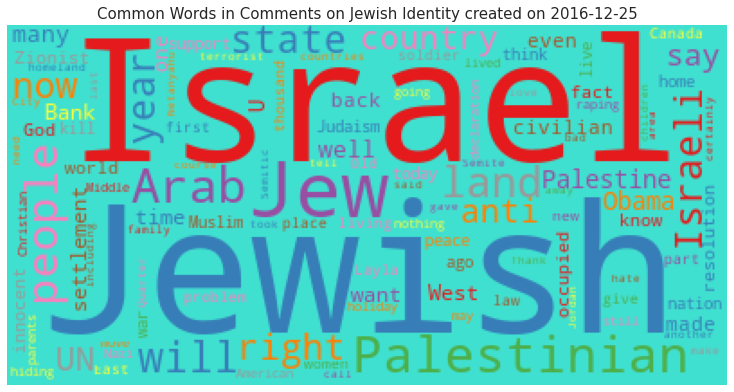

In [ ]:
temp = " ".join(train[(train['created_date']=='2016-12-25') & (train['jewish_bin']==1)]['comment_text'])

plt.figure(figsize=(10, 6))
wordcloud = WordCloud(width = 400, height = 200,
                    background_color = 'turquoise',
                    colormap = 'Set1',
                    collocations = False,
                    stopwords = stopwords,
                    min_font_size = 6,
                    random_state = 21).generate(temp)
plt.title("Common Words in Comments on Jewish Identity created on 2016-12-25", fontsize=15)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.show()

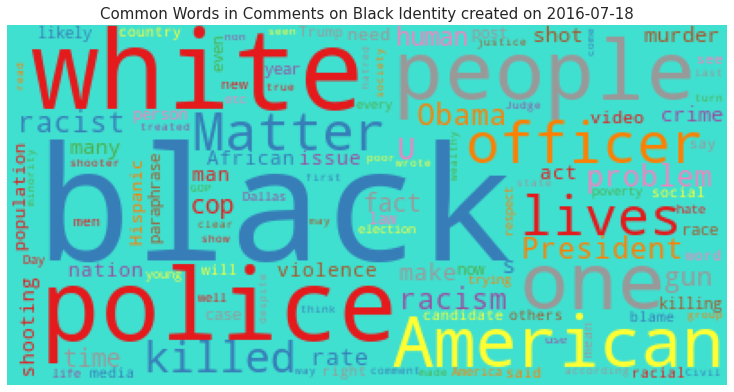

In [ ]:
temp = " ".join(train[(train['created_date']=='2016-07-18') & (train['black_bin']==1)]['comment_text'])

plt.figure(figsize=(10, 6))
wordcloud = WordCloud(width = 400, height = 200,
                    background_color = 'turquoise',
                    colormap = 'Set1',
                    collocations = False,
                    stopwords = stopwords,
                    min_font_size = 6,
                    random_state = 21).generate(temp)
plt.title("Common Words in Comments on Black Identity created on 2016-07-18", fontsize=15)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.show()

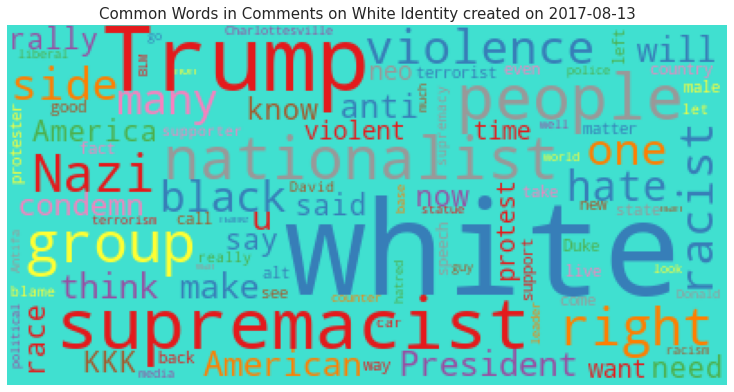

In [ ]:
temp = " ".join(train[(train['created_date']=='2017-08-13') & (train['white_bin']==1)]['comment_text']) 

plt.figure(figsize=(10, 6))
wordcloud = WordCloud(width = 400, height = 200,
                    background_color = 'turquoise',
                    colormap = 'Set1',
                    collocations = False,
                    stopwords = stopwords,
                    min_font_size = 6,
                    random_state = 21).generate(temp)
plt.title("Common Words in Comments on White Identity created on 2017-08-13", fontsize=15)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.show()

Observations:
- Identities black and white are overall the highest in number throughout entire time period.
- 25th Dec,2016 observes a significant rise in number of comments on jewish identity constituting for 4.8% of total comments that day. Upon surfing, it is found that this rise might be due to major events in an Israel-Palestine conflict going on during the time. (source - https://en.wikipedia.org/wiki/United_Nations_Security_Council_Resolution_2334)
- 18th July,2016 observes a significant rise in number of comments on black as well as white identity constituting for 7.2% and 4.6% of total comments that day. It is found that there were major events that took place in the first half of the month which reignited the black lives matter movement which could have led to the rise. (source - https://www.abc.net.au/news/2016-07-14/black-lives-matter-timeline/7585856)
- 13th Aug,2017 observes a significant rise in number of comments on white identity constituting for 9.3% of total comments that day. A white nationalist rally was in action a day before and there were a few casualties which could have sparked the rise. (source - https://en.wikipedia.org/wiki/Charlottesville_car_attack)




In [ ]:
TimeSeriesPlot(query_df, religion, 'Religion', None)

In [ ]:
TimeSeriesPlot(query_df_toxic, religion, 'Religion', 'Toxic')

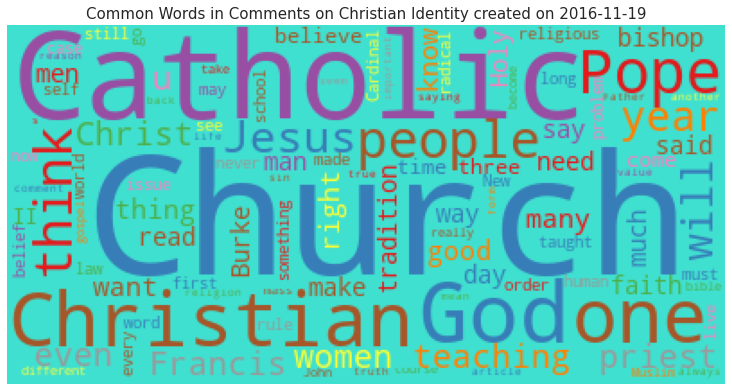

In [ ]:
temp = " ".join(train[(train['created_date']=='2016-11-19') & (train['christian_bin']==1)]['comment_text']) 

plt.figure(figsize=(10, 6))
wordcloud = WordCloud(width = 400, height = 200,
                    background_color = 'turquoise',
                    colormap = 'Set1',
                    collocations = False,
                    stopwords = stopwords,
                    min_font_size = 6,
                    random_state = 21).generate(temp)
plt.title("Common Words in Comments on Christian Identity created on 2016-11-19", fontsize=15)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.show()

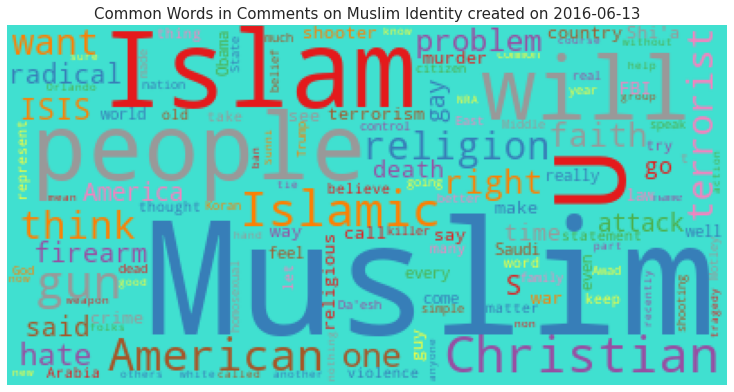

In [ ]:
temp = " ".join(train[(train['created_date']=='2016-06-13') & (train['muslim_bin']==1)]['comment_text']) 

plt.figure(figsize=(10, 6))
wordcloud = WordCloud(width = 400, height = 200,
                    background_color = 'turquoise',
                    colormap = 'Set1',
                    collocations = False,
                    stopwords = stopwords,
                    min_font_size = 6,
                    random_state = 21).generate(temp)
plt.title("Common Words in Comments on Muslim Identity created on 2016-06-13", fontsize=15)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.show()

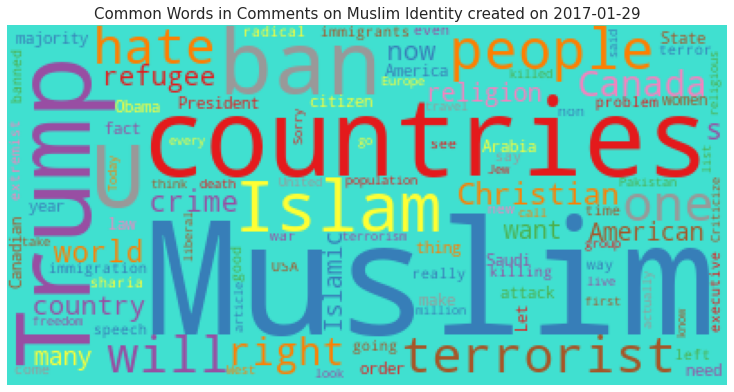

In [ ]:
temp = " ".join(train[(train['created_date']=='2017-01-29') & (train['muslim_bin']==1)]['comment_text']) 

plt.figure(figsize=(10, 6))
wordcloud = WordCloud(width = 400, height = 200,
                    background_color = 'turquoise',
                    colormap = 'Set1',
                    collocations = False,
                    stopwords = stopwords,
                    min_font_size = 6,
                    random_state = 21).generate(temp)
plt.title("Common Words in Comments on Muslim Identity created on 2017-01-29", fontsize=15)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.show()

Observations:
- Identities christian and muslim are overall the highest in number throughout entire time period.
- 19th Nov,2016 observes a significant rise in number of comments on christian identity constituting for 8.8% of total comments that day. This could be probably because of a dialogue being passed between Trump and Pope Francis around that time. (source - https://www.theguardian.com/world/2016/nov/19/pope-francis-decries-epidemic-of-animosity-toward-minorities)
- 13th Jun,2016 observes a significant rise in number of comments on muslim identity constituting for 7.3% of total comments that day. It is found that there were major events like Florida gay nightclub shooting, ISIS connection with the Florida event, Trump's statements on the event which led to the rise. (source - https://edition.cnn.com/2016/06/12/us/orlando-nightclub-shooting/index.html) 
- 29th Jan,2017 observes a significant sudden rise in number of comments on muslim identity constituting for 9.1% of total comments that day. Upon surfing, it is found that this rise might be due to Trump barring the entry of refugees and citizens from 7 Muslim countries. (source - https://www.nytimes.com/2017/01/27/us/politics/trump-syrian-refugees.html)




In [ ]:
TimeSeriesPlot(query_df, gender, 'Gender', None)

In [ ]:
TimeSeriesPlot(query_df_toxic, gender, 'Gender', 'Toxic')

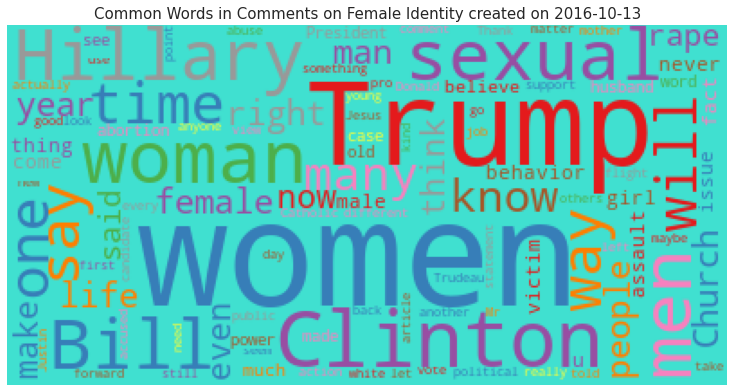

In [ ]:
temp = " ".join(train[(train['created_date']=='2016-10-13') & (train['female_bin']==1)]['comment_text']) 

plt.figure(figsize=(10, 6))
wordcloud = WordCloud(width = 400, height = 200,
                    background_color = 'turquoise',
                    colormap = 'Set1',
                    collocations = False,
                    stopwords = stopwords,
                    min_font_size = 6,
                    random_state = 21).generate(temp)
plt.title("Common Words in Comments on Female Identity created on 2016-10-13", fontsize=15)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.show()

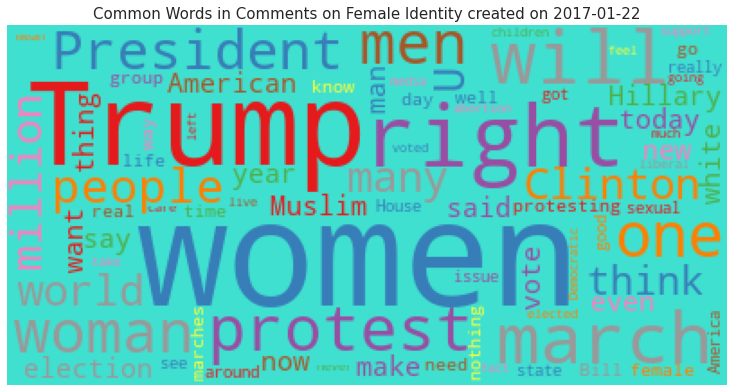

In [ ]:
temp = " ".join(train[(train['created_date']=='2017-01-22') & (train['female_bin']==1)]['comment_text']) 

plt.figure(figsize=(10, 6))
wordcloud = WordCloud(width = 400, height = 200,
                    background_color = 'turquoise',
                    colormap = 'Set1',
                    collocations = False,
                    stopwords = stopwords,
                    min_font_size = 6,
                    random_state = 21).generate(temp)
plt.title("Common Words in Comments on Female Identity created on 2017-01-22", fontsize=15)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.show()

Observations:

- Identities male and female are overall the highest in number throughout entire time period.
- 13th Oct,2016 observes a significant rise in number of comments on female identity constituting for 13.4% of total comments that day. Several accusations of sexual misconduct by Trump towards women surfaced on the web and that could be a major reason.(source - https://theweek.com/10things/650889/10-things-need-know-today-october-13-2016)
- 22nd Jan,2017 observes a significant rise in number of comments on female identity constituting for 11.7% of total comments that day. It is found that there was a Women's March against Trump which may have led to the rise in comments.(source - https://theweek.com/10things/670931/10-things-need-know-today-january-22-2017)

In [ ]:
TimeSeriesPlot(query_df, sexual_orientation, 'Sexual Orientation', None)

In [ ]:
TimeSeriesPlot(query_df_toxic, sexual_orientation, 'Sexual Orientation', 'Toxic')

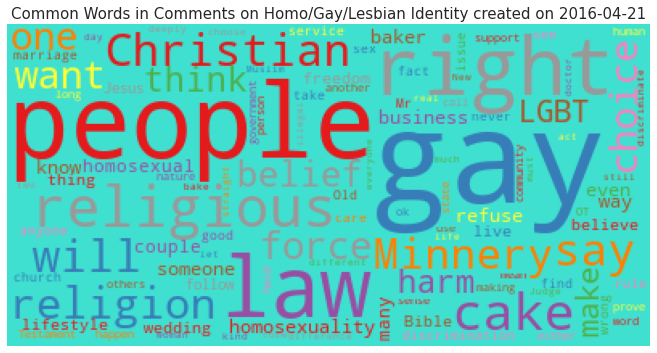

In [ ]:
temp = " ".join(train[(train['created_date']=='2016-04-21') & (train['homosexual_gay_or_lesbian_bin']==1)]['comment_text']) 

plt.figure(figsize=(10, 6))
wordcloud = WordCloud(width = 400, height = 200,
                    background_color = 'turquoise',
                    colormap = 'Set1',
                    collocations = False,
                    stopwords = stopwords,
                    min_font_size = 6,
                    random_state = 21).generate(temp)
plt.title("Common Words in Comments on Homo/Gay/Lesbian Identity created on 2016-04-21", fontsize=15)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.show()

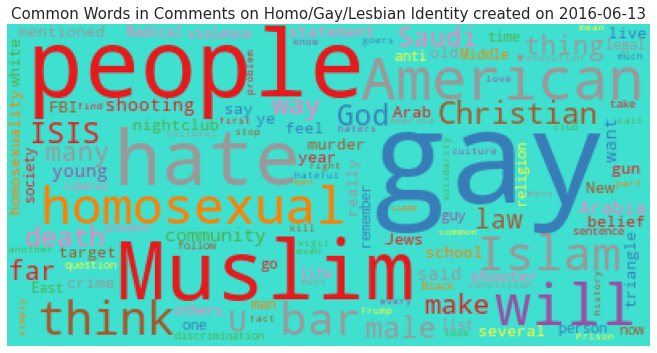

In [ ]:
temp = " ".join(train[(train['created_date']=='2016-06-13') & (train['homosexual_gay_or_lesbian_bin']==1)]['comment_text']) 

plt.figure(figsize=(10, 6))
wordcloud = WordCloud(width = 400, height = 200,
                    background_color = 'turquoise',
                    colormap = 'Set1',
                    collocations = False,
                    stopwords = stopwords,
                    min_font_size = 6,
                    random_state = 21).generate(temp)
plt.title("Common Words in Comments on Homo/Gay/Lesbian Identity created on 2016-06-13", fontsize=15)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.show()

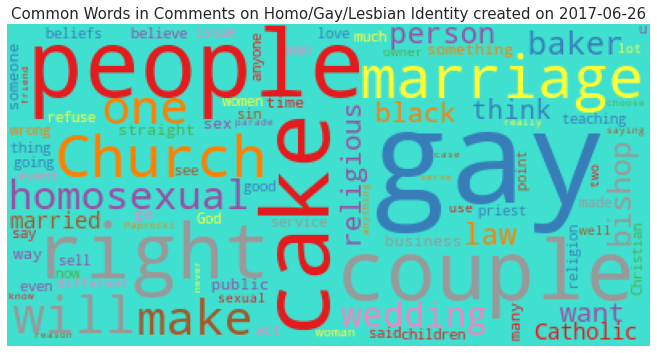

In [ ]:
temp = " ".join(train[(train['created_date']=='2017-06-26') & (train['homosexual_gay_or_lesbian_bin']==1)]['comment_text']) 

plt.figure(figsize=(10, 6))
wordcloud = WordCloud(width = 400, height = 200,
                    background_color = 'turquoise',
                    colormap = 'Set1',
                    collocations = False,
                    stopwords = stopwords,
                    min_font_size = 6,
                    random_state = 21).generate(temp)
plt.title("Common Words in Comments on Homo/Gay/Lesbian Identity created on 2017-06-26", fontsize=15)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.show()

Observations:
- Identity homosexual_gay_lesbian is overall the highest in number throughout entire time period.
-  21st Apr,2016 recorded the highest number of comments on homosexual_gay_lesbian identity constituting for 6.5% of total comments that day. This is observed mainly because of Jim Minnery an anti-lgbtq activist in the US who went on record to make insensitive statements.(source - https://www.adn.com/commentary/article/how-religious-rights-and-lgbt-rights-can-co-exist-anchorage/2016/04/21/)
- 13th Jun,2016 observes a sudden rise in number of comments on homosexual_gay_lesbian identity constituting for 4.8% of total comments that day. The reason being that there was a shooting in gay nightclub in Orlando which had a connection with ISIS, this is discussed in Religion sub-section above.(source - https://edition.cnn.com/2016/06/12/us/orlando-nightclub-shooting/index.html)
- 26th Jun,2017 observes a sudden rise in number of comments on homosexual_gay_lesbian identity constituting for 3% of total comments that day. The reason being an order is passed in the US that same-sex couples should both be listed on birth certificates.(source - https://www.denver7.com/news/national/june-26-a-historic-day-for-lgbtq-rights)


In [ ]:
TimeSeriesPlot(query_df, disability, 'Disability', None)

In [ ]:
TimeSeriesPlot(query_df_toxic, disability, 'Disability', 'Toxic')

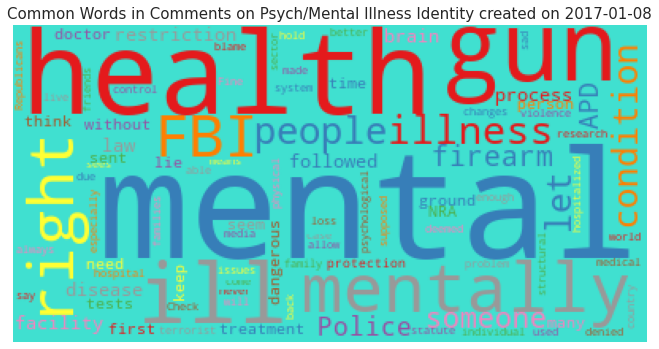

In [ ]:
temp = " ".join(train[(train['created_date']=='2017-01-08') & (train['psychiatric_or_mental_illness']==1)]['comment_text']) 

plt.figure(figsize=(10, 6))
wordcloud = WordCloud(width = 400, height = 200,
                    background_color = 'turquoise',
                    colormap = 'Set1',
                    collocations = False,
                    stopwords = stopwords,
                    min_font_size = 6,
                    random_state = 21).generate(temp)
plt.title("Common Words in Comments on Psych/Mental Illness Identity created on 2017-01-08", fontsize=15)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.show()

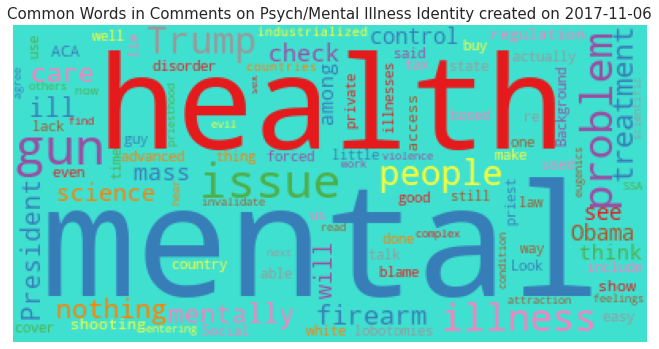

In [ ]:
temp = " ".join(train[(train['created_date']=='2017-11-06') & (train['psychiatric_or_mental_illness']==1)]['comment_text']) 

plt.figure(figsize=(10, 6))
wordcloud = WordCloud(width = 400, height = 200,
                    background_color = 'turquoise',
                    colormap = 'Set1',
                    collocations = False,
                    stopwords = stopwords,
                    min_font_size = 6,
                    random_state = 21).generate(temp)
plt.title("Common Words in Comments on Psych/Mental Illness Identity created on 2017-11-06", fontsize=15)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.show()

Observations:
- Identity psychiatric_mental_illness is overall the highest in number throughout entire time period.
-  8th Jan,2017 recorded sudden rise in number of comments on psychiatric_mental_illness identity constituting for 1.8% of total comments that day. This is observed mainly because of Florida airport shooting incident wherein the accused was later found out to be schizophrenic.(source - https://www.abc.net.au/news/2017-01-08/florida-airport-shooting-suspect-had-confiscated-gun-returned/8168294)
-  6th Nov,2017 yet again recorded a sudden rise in number of comments on psychiatric_mental_illness identity constituting for 1.7% of total comments that day. The reason was mainly that there was a shooting in a church in Texas and Trump stated that this is because of mental health problem indicating that the shooter was mentally ill.(source - https://theweek.com/10things/732667/10-things-need-know-today-november-6-2017)
- The percentage of comments on disability remains under 2% from April'2016 onwards.


## **2.9 Frequently Occuring Words using WordCloud**

In [ ]:
stopwords = set(STOPWORDS)

In [ ]:
# refer - https://towardsdatascience.com/simple-wordcloud-in-python-2ae54a9f58e5
def createPosNeg(data, id=None):
    '''
    Return a list of 2 strings:
    1. String created concatenating all toxic comments
    2. String created concatenating all non-toxic comments
    Also provides option to select comments mentioning a particular identity to create concatenated strings.
    '''
    if id:
        toxic_comments = " ".join(data[(data[id]==1) & (data['target_bin']==1)]['comment_text'])
        nontoxic_comments = " ".join(data[(data[id]==1) & (data['target_bin']==0)]['comment_text'])
    else:
        toxic_comments = " ".join(data[data['target_bin']==1]['comment_text'])
        nontoxic_comments = " ".join(data[data['target_bin']==0]['comment_text'])

    pos_neg = [nontoxic_comments, toxic_comments]
    return pos_neg

def plotWordCloud(pos_neg, id=None):
    '''
    Returns 2 WordClouds:
    1. Containing common words in toxic comments
    2. Containg common words in non-toxic comments
    Also provides option to display WordClouds generated from comments mentioning a particular identity.
    '''
    class_dict = {0:'Non-Toxic', 1:'Toxic'}
    bg_dict = {0:'salmon', 1:'black'}
    cmap_dict = {0:'Pastel1', 1:'Set2'}

    plt.figure(figsize=(30, 8))
    for i in range(2):
        plt.subplot(1,2,i+1)
        wordcloud = WordCloud(width = 400, height = 200,
                        background_color = bg_dict[i],
                        colormap = cmap_dict[i],
                        collocations = False,
                        stopwords = stopwords,
                        min_font_size = 6,
                        random_state = 42).generate(pos_neg[i])
        if id:
            plt.title(f"Common Words in {class_dict[i]} Comments highlighting {id} Identity", fontsize=20)
        else:
            plt.title(f"Common Words in {class_dict[i]} Comments", fontsize=20)
        plt.imshow(wordcloud)
        plt.axis("off")
        plt.tight_layout(pad = 0)

    return plt.show()

### **Toxic/Non-Toxic Comments**

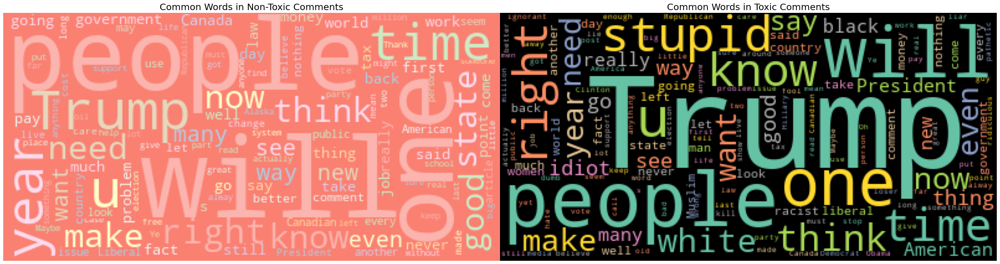

In [ ]:
pos_neg = createPosNeg(train, id=None)
plotWordCloud(pos_neg, id=None)

### **Toxic/Non-Toxic Comments highlighting an Identity**

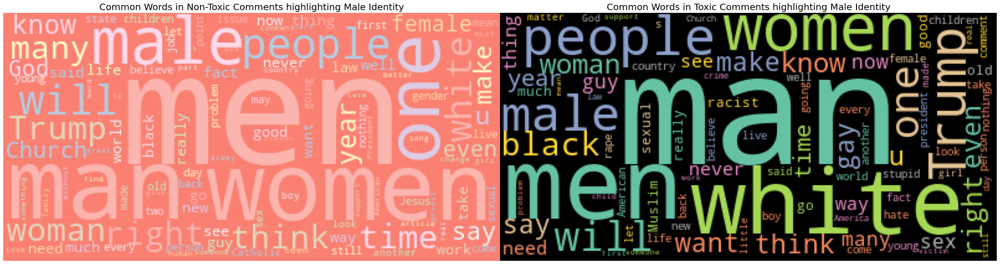

In [ ]:
pos_neg = createPosNeg(train, id=identity_main_bin[0])
plotWordCloud(pos_neg, id=(identity_main_bin[0].replace('_bin','')).capitalize())

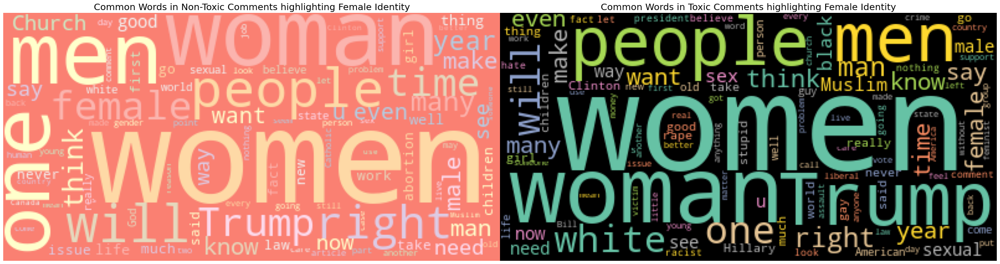

In [ ]:
pos_neg = createPosNeg(train, id=identity_main_bin[1])
plotWordCloud(pos_neg, id=(identity_main_bin[1].replace('_bin','')).capitalize())

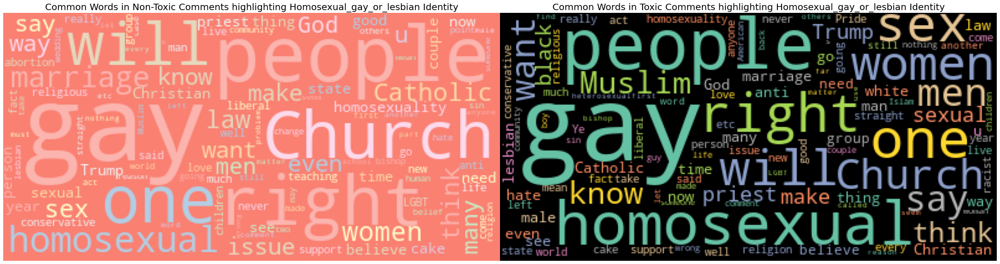

In [ ]:
pos_neg = createPosNeg(train, id=identity_main_bin[2])
plotWordCloud(pos_neg, id=(identity_main_bin[2].replace('_bin','')).capitalize())

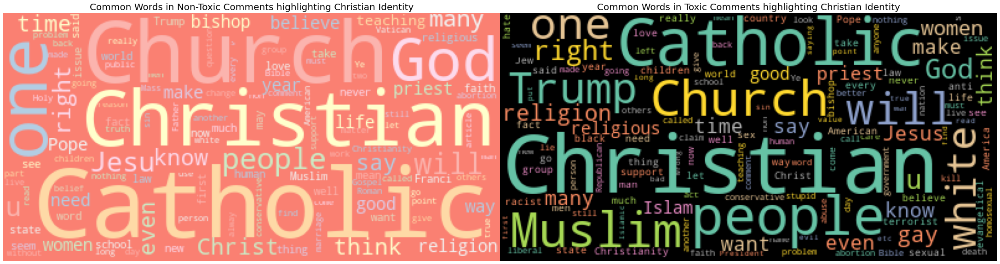

In [ ]:
pos_neg = createPosNeg(train, id=identity_main_bin[3])
plotWordCloud(pos_neg, id=(identity_main_bin[3].replace('_bin','')).capitalize())

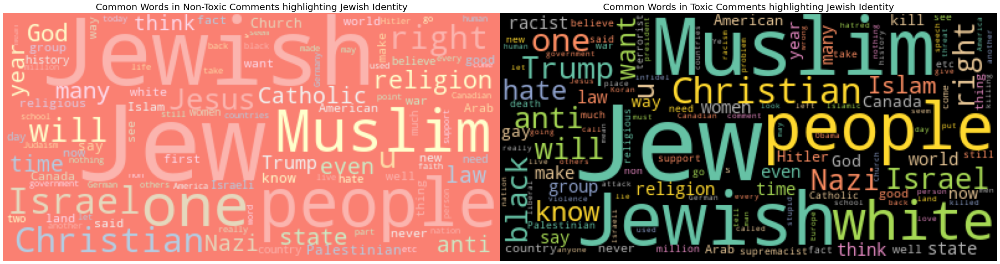

In [ ]:
pos_neg = createPosNeg(train, id=identity_main_bin[4])
plotWordCloud(pos_neg, id=(identity_main_bin[4].replace('_bin','')).capitalize())

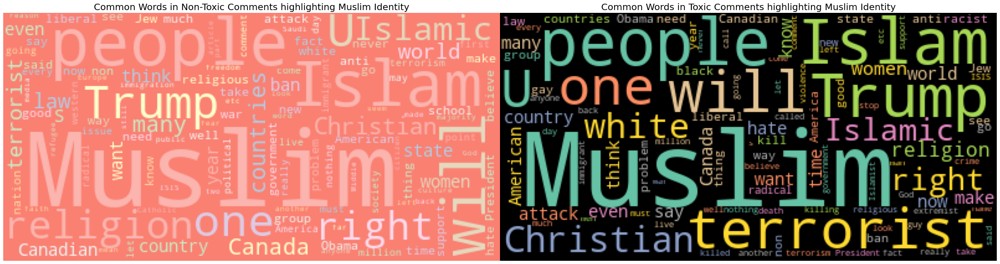

In [ ]:
pos_neg = createPosNeg(train, id=identity_main_bin[5])
plotWordCloud(pos_neg, id=(identity_main_bin[5].replace('_bin','')).capitalize())

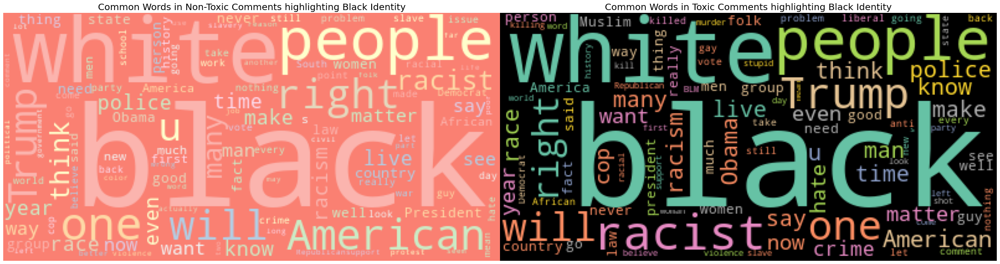

In [ ]:
pos_neg = createPosNeg(train, id=identity_main_bin[6])
plotWordCloud(pos_neg, id=(identity_main_bin[6].replace('_bin','')).capitalize())

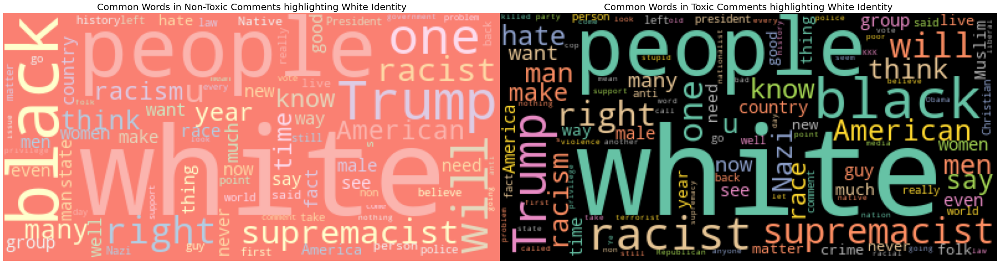

In [ ]:
pos_neg = createPosNeg(train, id=identity_main_bin[7])
plotWordCloud(pos_neg, id=(identity_main_bin[7].replace('_bin','')).capitalize())

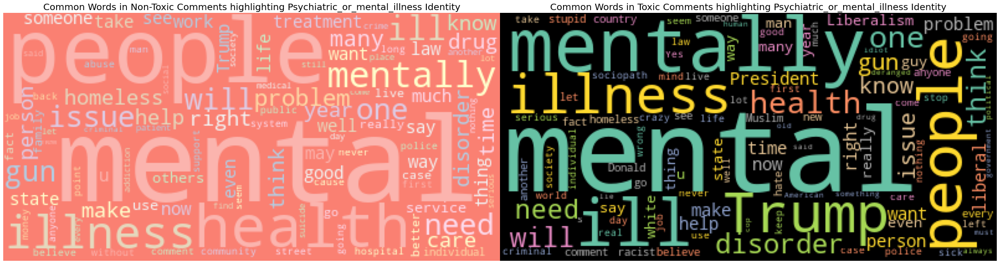

In [ ]:
pos_neg = createPosNeg(train, id=identity_main_bin[8])
plotWordCloud(pos_neg, id=(identity_main_bin[8].replace('_bin','')).capitalize())

Observations:
- It is observed that there are common words that are significantly used in both toxic and non-toxic comments. 
- Similarly, with comments highlighting an identity there are common words that are significantly used in both toxic and non-toxic comments.
- This could be the reason why models generated in the previous Kaggle Competition observed and unintended bias towards certain identities.

# **3. References**
- https://www.kaggle.com/competitions/jigsaw-unintended-bias-in-toxicity-classification/overview/evaluation (Understanding Evaluation Metric)
- https://www.kaggle.com/competitions/jigsaw-unintended-bias-in-toxicity-classification/data(Understanding Data)
- https://www.analyticsvidhya.com/blog/2020/04/beginners-guide-exploratory-data-analysis-text-data/#h2_7 (Text Data Analysis Guide)
- https://www.analyticsvidhya.com/blog/2021/10/a-comprehensive-guide-to-time-series-analysis/ (Time Series Analysis Guide)
- https://towardsdatascience.com/simple-wordcloud-in-python-2ae54a9f58e5 (Word Cloud Guide)
